loading package and set colors

In [ ]:
library(ggplot2)
library(liger)
library(cowplot)
library(dplyr)
library(tibble)
library(patchwork)
library(Seurat)
library(magrittr)
library(gghalves)

In [71]:
custom_colors <- list()

colors_dutch <- c("#16a085", "#2980b9", "#84817a", "#f39c12", "#c0392b",
                  "#130f40", "#f78fb3", "#65d6ce", "#d1c145", "#2ecc71",
                  "#d35400", "#c44569", '#ff7f50', '#706fd3', '#f9ca24',
                  '#34ace0', '#33d9b2', '#2c2c54', '#be2edd')

colors_spanish <- c(
  '#40407a','#706fd3','#f7f1e3','#34ace0','#33d9b2',
  '#2c2c54','#474787','#aaa69d','#227093','#218c74',
  '#ff5252','#ff793f','#d1ccc0','#ffb142','#ffda79',
  '#b33939','#cd6133','#4834d4','#cc8e35','#ccae62'
)

custom_colors$discrete <- c(colors_dutch, colors_spanish)

custom_colors$cell_type <- c("#d35400", "#2980b9", "#2c2c54", "#f39c12", "#c0392b",
                              "#4cd137", "#f78fb3", "#65d6ce", "#d1c145", "#2ecc71",
                              "#16a085", "#c44569", '#ff7f50', '#706fd3', '#f9ca24',
                              '#34ace0', '#33d9b2', '#8e44ad', '#be2edd','#ccae62')

custom_colors$cell_cycle <- setNames(
  c('#45aaf2', '#f1c40f', '#e74c3c', '#7f8c8d'),
  c('G1',      'S',       'G2M',     '-')
)

In [10]:
options(repr.plot.width = 18, repr.plot.height = 17, repr.plot.pointsize = 24)

In [8]:
microglia <- readRDS("/home/adufour/work/rds_storage/microglia/microglia.rds")

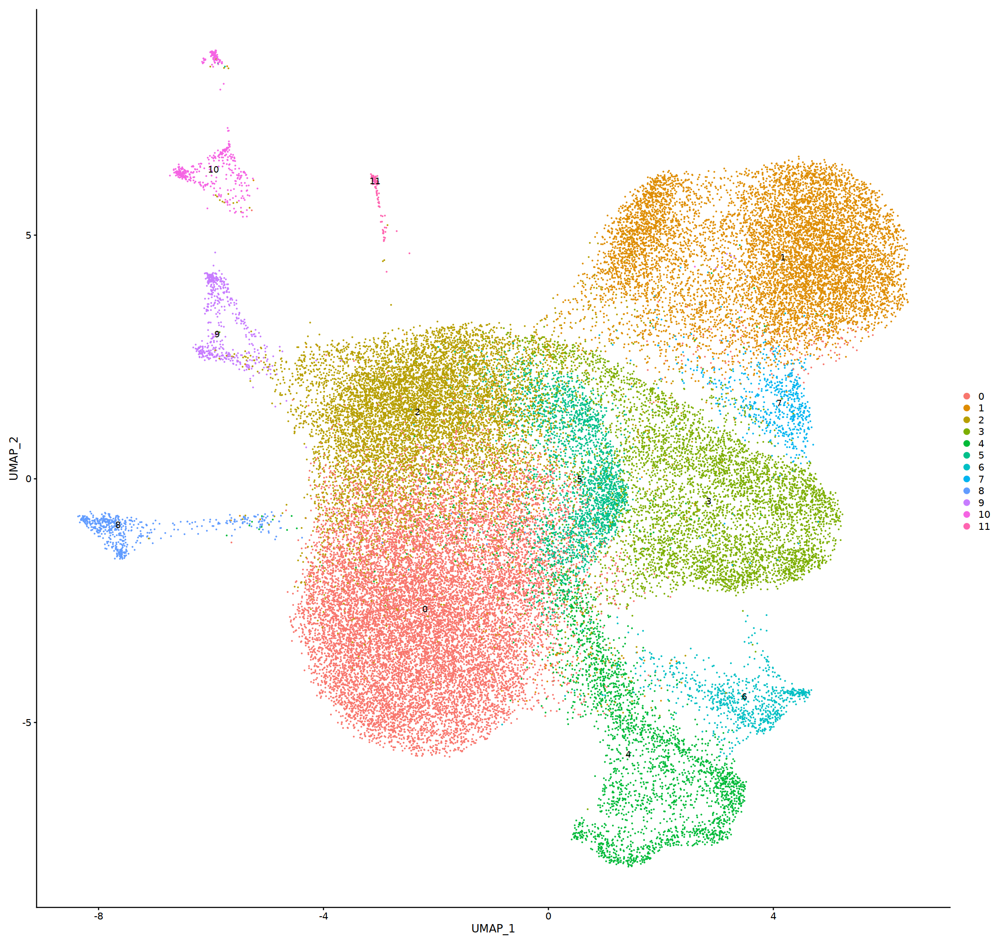

In [11]:
DimPlot(microglia, reduction = "umap", label = TRUE)

In [13]:
UMAP_centers_cluster <- tibble(
    UMAP_1 = as.data.frame(microglia@reductions$umap@cell.embeddings)$UMAP_1,
    UMAP_2 = as.data.frame(microglia@reductions$umap@cell.embeddings)$UMAP_2,
    cluster = microglia@meta.data$seurat_clusters
  ) %>%
  group_by(cluster) %>%
  summarize(x = median(UMAP_1), y = median(UMAP_2))

p <- bind_cols(microglia@meta.data, as.data.frame(microglia@reductions$umap@cell.embeddings)) %>%
  ggplot(aes(UMAP_1, UMAP_2, color = seurat_clusters)) +
  geom_point(size = 0.2) +
  geom_label(
    data = UMAP_centers_cluster,
    mapping = aes(x, y, label = cluster),
    size = 4.5,
    fill = 'white',
    color = 'black',
    fontface = 'bold',
    alpha = 0.5,
    label.size = 0,
    show.legend = FALSE
  ) +
  theme_bw() +
  scale_color_manual(
    name = 'Cluster', values = custom_colors$discrete,
    guide = guide_legend(override.aes = list(size = 2))
  ) +
  theme(legend.position = 'right') +
  coord_fixed() +
  annotate(
    geom = 'text', x = Inf, y = -Inf,
    label = paste0('n = ', format(nrow(microglia@meta.data), big.mark = ',', trim = TRUE)),
    vjust = -1.5, hjust = 1.25, color = 'black', size = 2.5
  )

In [14]:
Idents(microglia) <- "STIM"

In [15]:
microglia_pbs <- subset(microglia, idents = "pbs")
microglia_il1 <- subset(microglia, idents = "il1")

In [16]:
Idents(microglia) <- "seurat_clusters"

In [17]:
table_samples_by_clusters <- microglia@meta.data %>%
  group_by(SAMP, seurat_clusters) %>%
  summarize(count = n()) %>%
  spread(seurat_clusters, count, fill = 0) %>%
  ungroup() %>%
  mutate(total_cell_count = rowSums(.[c(2:ncol(.))])) %>%
  dplyr::select(c('SAMP', 'total_cell_count', everything())) %>%
  arrange(factor(SAMP, levels = levels(microglia@meta.data$SAMP)))

knitr::kable(table_samples_by_clusters)

`summarise()` has grouped output by 'SAMP'. You can override using the `.groups` argument.




|SAMP    | total_cell_count|    0|    1|    2|   3|    4|   5|   6|  7|   8|   9|  10| 11|
|:-------|----------------:|----:|----:|----:|---:|----:|---:|---:|--:|---:|---:|---:|--:|
|P1-IL1a |             1871|  491|  558|  251| 241|   78| 150|  20| 62|   7|   9|   4|  0|
|P1-IL1b |             1472|  365|  532|  163| 170|   32| 104|  11| 38|  49|   7|   1|  0|
|P1-PBSa |             1857|  505|  551|  301| 257|    9| 150|   9| 51|  11|  11|   2|  0|
|P1-PBSb |             1732|  506|  450|  233| 275|   29| 153|  15| 53|   2|  11|   5|  0|
|P3-IL1a |             1371|  404|  236|  200| 179|  188|  44|  58| 33|   1|  10|  18|  0|
|P3-IL1b |             1344|  318|  176|  118| 220|  307|  26| 109| 37|   0|  30|   1|  2|
|P3-PBSa |             1389|  419|  384|  228| 175|    4|  93|  15| 37|   6|  19|   9|  0|
|P3-PBSb |             1216|  339|  305|  189| 191|    9| 109|   8| 22|  34|   8|   2|  0|
|P5-IL1a |             1163|  512|  234|  242|  29|   74|  24|  30|  2|   0|   7|   4|  

In [18]:
table_clusters_by_samples <- microglia@meta.data %>%
  dplyr::rename('cluster' = 'seurat_clusters') %>%
  group_by(cluster, SAMP) %>%
  summarize(count = n()) %>%
  spread(SAMP, count, fill = 0) %>%
  ungroup() %>%
  mutate(total_cell_count = rowSums(.[c(2:ncol(.))])) %>%
  dplyr::select(c('cluster', 'total_cell_count', everything())) %>%
  arrange(factor(cluster, levels = levels(microglia@meta.data$seurat_clusters)))

knitr::kable(table_clusters_by_samples)

`summarise()` has grouped output by 'cluster'. You can override using the `.groups` argument.




|cluster | total_cell_count| P1-IL1a| P1-IL1b| P1-PBSa| P1-PBSb| P3-IL1a| P3-IL1b| P3-PBSa| P3-PBSb| P5-IL1a| P5-IL1b| P5-IL1c| P5-IL1d| P5-IL1e| P5-IL1f| P5-PBSa| P5-PBSb| P5-PBSc| P5-PBSd| P5-PBSe| P5-PBSf|
|:-------|----------------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|-------:|
|0       |            14712|     491|     365|     505|     506|     404|     318|     419|     339|     512|     379|    3023|    1206|     315|    1812|     249|     231|     754|     149|    1346|    1389|
|1       |             9455|     558|     532|     551|     450|     236|     176|     384|     305|     234|     174|    1329|     533|     124|     858|     391|     277|     352|     207|     807|     977|
|2       |             9018|     251|     163|     301|     233|     200|     118|     228|     189|     242|     125|    1729|     864|     163|    1390|     172

In [19]:
temp_labels <- microglia@meta.data %>%
  group_by(SAMP) %>%
  tally()

p1 <- table_samples_by_clusters %>%
  dplyr::select(-c('total_cell_count')) %>%
  reshape2::melt(id.vars = 'SAMP') %>%
  dplyr::mutate(SAMP = factor(SAMP, levels = c("P1-IL1a","P1-IL1b","P1-PBSa","P1-PBSb",
                                               "P3-IL1a","P3-IL1b","P3-PBSa","P3-PBSb",
                                               "P5-IL1a","P5-IL1b","P5-IL1c","P5-IL1d","P5-IL1e","P5-IL1f",
                                               "P5-PBSa","P5-PBSb","P5-PBSc","P5-PBSd","P5-PBSe","P5-PBSf"))) %>%
  ggplot(aes(SAMP, value)) +
  geom_bar(aes(fill = variable), position = 'fill', stat = 'identity') +
  geom_text(
    data = temp_labels,
    aes(x = SAMP, y = Inf, label = paste0('n = ', format(n, big.mark = ',', trim = TRUE)), vjust = -1),
    color = 'black', size = 2
  ) +
  scale_fill_manual(name = 'Clusters', values = custom_colors$discrete) +
  scale_y_continuous(name = 'Percentage [%]', labels = scales::percent_format(), expand = c(0.01,0)) +
  coord_cartesian(clip = 'off') +
  theme_bw() +
  theme(
    legend.position = 'left',
    plot.title = element_text(hjust = 0.5),
    text = element_text(size = 16),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    axis.title.x = element_blank(),
    axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1),
    plot.margin = margin(t = 20, r = 0, b = 0, l = 0, unit = 'pt')
  )

temp_labels <- microglia@meta.data %>%
  group_by(seurat_clusters) %>%
  tally() %>%
  dplyr::rename('cluster' = seurat_clusters)

p2 <- table_clusters_by_samples %>%
  dplyr::select(-c('total_cell_count')) %>%
  reshape2::melt(id.vars = 'cluster') %>%
  mutate(cluster = factor(cluster, levels = levels(microglia@meta.data$seurat_clusters))) %>%
  ggplot(aes(cluster, value)) +
  geom_bar(aes(fill = variable), position = 'fill', stat = 'identity') +
  geom_text(
    data = temp_labels, aes(x = cluster, y = Inf, label = paste0('n = ', format(n, big.mark = ',', trim = TRUE)), vjust = -1),
    color = 'black', size = 2
  ) +
  scale_fill_manual(name = 'Samples', values = custom_colors$discrete) +
  scale_y_continuous(name = 'Percentage [%]', labels = scales::percent_format(), expand = c(0.01,0)) +
  coord_cartesian(clip = 'off') +
  theme_bw() +
  theme(
    legend.position = 'right',
    plot.title = element_text(hjust = 0.5),
    text = element_text(size = 16),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    axis.title = element_blank(),
    plot.margin = margin(t = 20, r = 0, b = 0, l = 10, unit = 'pt')
  )

In [20]:
ggsave(
  '/home/adufour/work/notebook/plots/Microglia/composition_samples_clusters_by_percent.pdf',
  p1 + p2 +
  plot_layout(ncol = 2, widths = c(20, microglia@meta.data$seurat_clusters %>% unique() %>% length())),
  width = 18, height = 8
)

load singler result

In [38]:
pred <- readRDS("/home/adufour/work/rds_storage/microglia/predictions.rds")

remove labels assigned to less than 20 cells

In [66]:
pred[which(pred$labels %in% names(table(pred$labels)[table(pred$labels) < 20])),]$labels <- "Undefined"

In [39]:
singler_scores <- pred@listData$scores %>%
  as_tibble() %>%
  dplyr::mutate(assigned_score = NA)

for ( i in seq_len(nrow(singler_scores)) ) {
  singler_scores$assigned_score[i] <- singler_scores[[pred@listData$labels[i]]][i]
}

microglia@meta.data$cell_type_singler_blueprintencode_main_score <- singler_scores$assigned_score

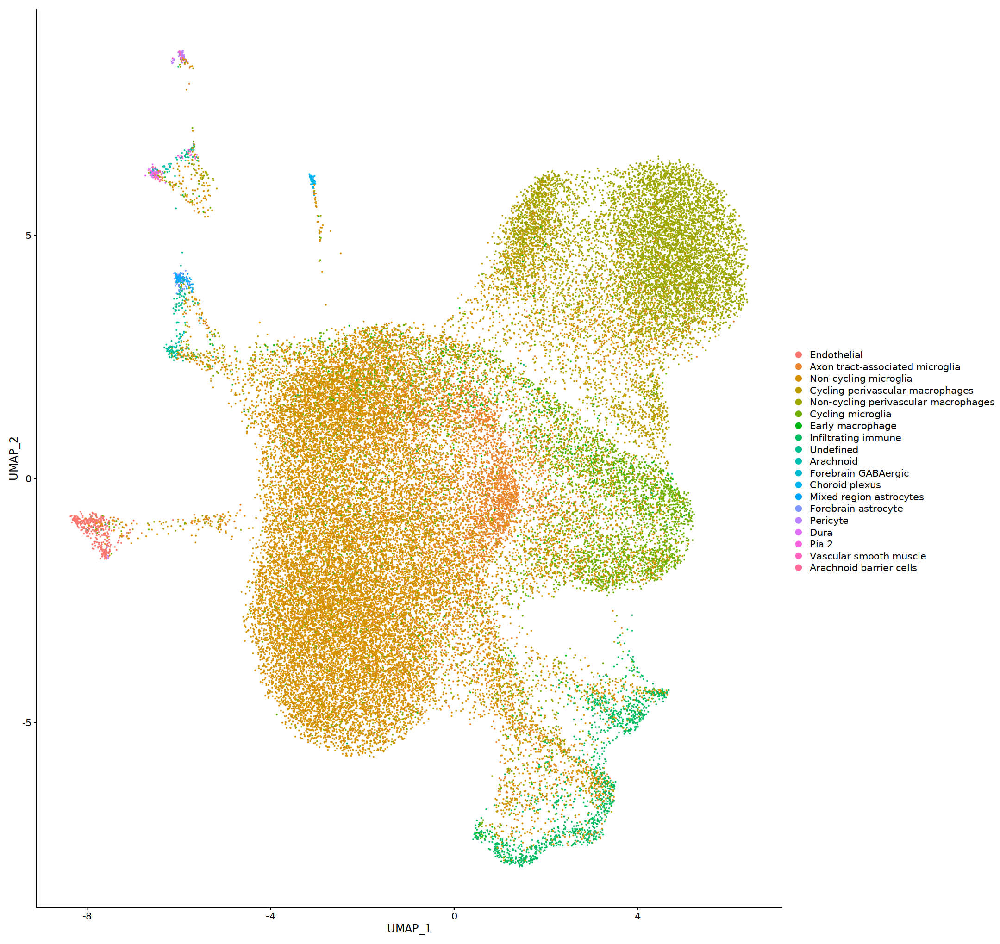

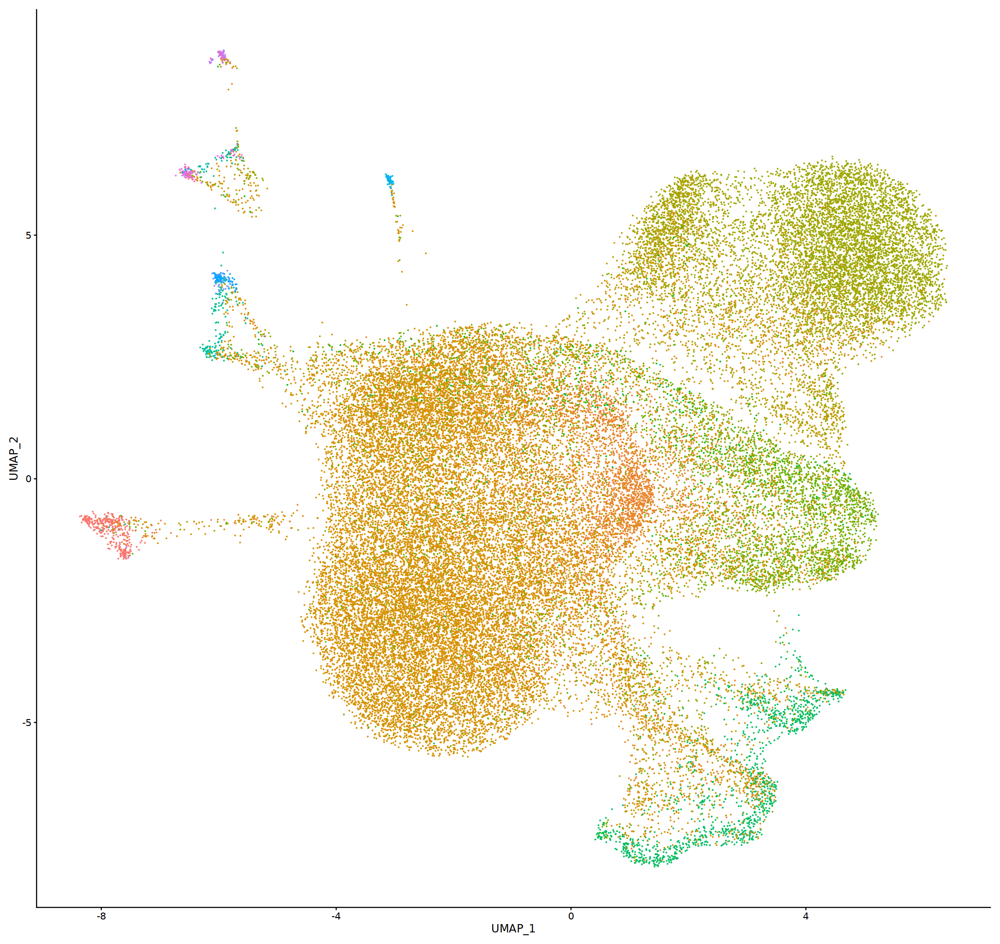

In [67]:
microglia[["SingleR.labels"]] <- pred$labels
microglia <- SetIdent(object = microglia, value = microglia[["SingleR.labels"]])
DimPlot(microglia, reduction = "umap")
DimPlot(microglia, reduction = "umap") + NoLegend()

Score cell cycle using seurat

In [25]:
microglia <- CellCycleScoring(
  microglia,
  s.features = cc.genes$s.genes,
  g2m.features = cc.genes$g2m.genes
)

microglia@meta.data$cell.cycle <- microglia@meta.data$Phase
microglia@meta.data$Phase <- NULL
microglia@meta.data$cell.cycle <- factor(
  microglia@meta.data$cell.cycle, levels = c('G1', 'S', 'G2M')
)

Warning message:
“The following features are not present in the object: MCM5, PCNA, TYMS, FEN1, MCM2, MCM4, RRM1, UNG, GINS2, MCM6, CDCA7, DTL, PRIM1, UHRF1, MLF1IP, HELLS, RFC2, RPA2, NASP, RAD51AP1, GMNN, WDR76, SLBP, CCNE2, UBR7, POLD3, MSH2, ATAD2, RAD51, RRM2, CDC45, CDC6, EXO1, TIPIN, DSCC1, BLM, CASP8AP2, USP1, CLSPN, POLA1, CHAF1B, BRIP1, E2F8, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: HMGB2, CDK1, NUSAP1, UBE2C, BIRC5, TPX2, TOP2A, NDC80, CKS2, NUF2, CKS1B, MKI67, TMPO, CENPF, TACC3, FAM64A, SMC4, CCNB2, CKAP2L, CKAP2, AURKB, BUB1, KIF11, ANP32E, TUBB4B, GTSE1, KIF20B, HJURP, CDCA3, HN1, CDC20, TTK, CDC25C, KIF2C, RANGAP1, NCAPD2, DLGAP5, CDCA2, CDCA8, ECT2, KIF23, HMMR, AURKA, PSRC1, ANLN, LBR, CKAP5, CENPE, CTCF, NEK2, G2E3, GAS2L3, CBX5, CENPA, not searching for symbol synonyms”
Warning message in AddModuleScore(object = object, features = features, name = name, :
“Could not find enough features in the object 

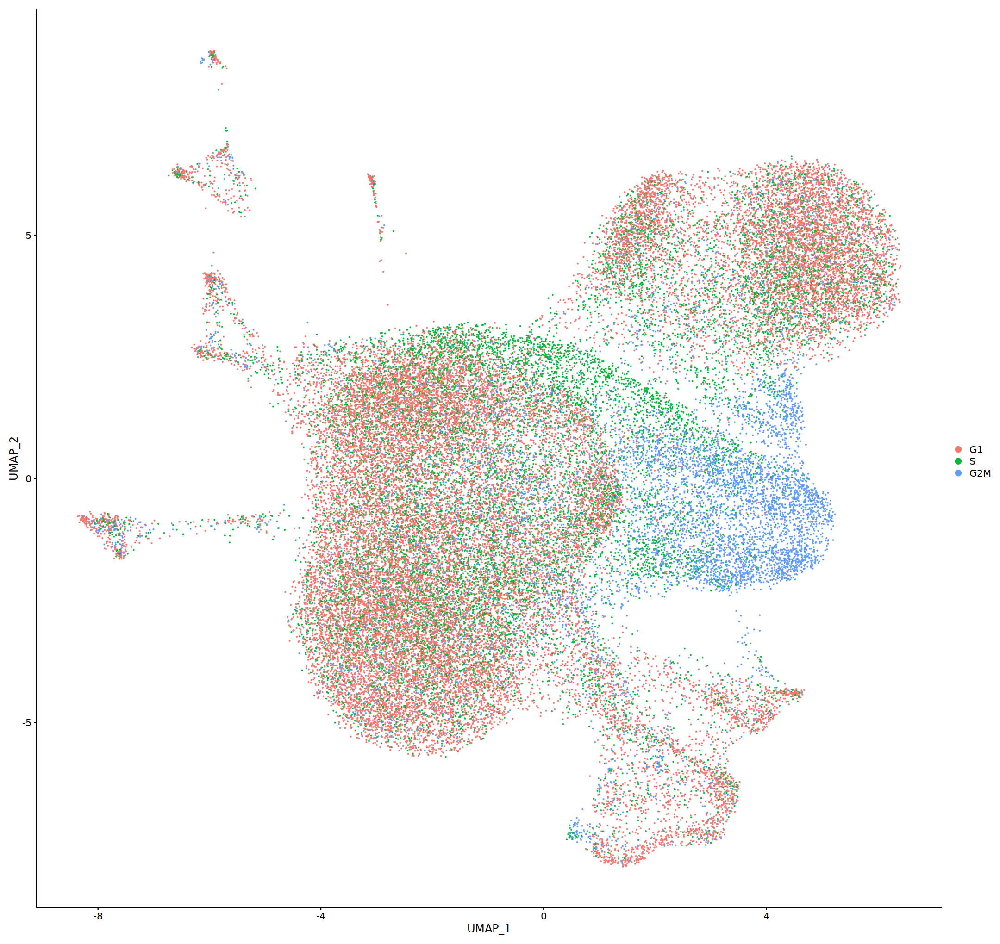

In [26]:
Idents(microglia) <- "cell.cycle"
DimPlot(microglia, reduction = "umap")
Idents(microglia) <- "seurat_clusters"

In [27]:
table_samples_by_cell_cycle <- microglia@meta.data %>%
  group_by(SAMP, cell.cycle) %>%
  summarize(count = n()) %>%
  spread(cell.cycle, count, fill = 0) %>%
  ungroup() %>%
  mutate(total_cell_count = rowSums(.[c(2:ncol(.))])) %>%
  dplyr::select(c('SAMP', 'total_cell_count', everything())) %>%
  arrange(factor(SAMP, levels = levels(microglia@meta.data$cell.cycle)))

`summarise()` has grouped output by 'SAMP'. You can override using the `.groups` argument.


In [28]:
table_clusters_by_cell_cycle <- microglia@meta.data %>%
  dplyr::rename(cluster = seurat_clusters) %>%
  group_by(cluster, cell.cycle) %>%
  summarize(count = n()) %>%
  spread(cell.cycle, count, fill = 0) %>%
  ungroup() %>%
  mutate(total_cell_count = rowSums(.[c(2:ncol(.))])) %>%
  dplyr::select(c('cluster', 'total_cell_count', everything())) %>%
  arrange(factor(cluster, levels = levels(microglia@meta.data$cell.cycle)))

knitr::kable(table_clusters_by_cell_cycle)

`summarise()` has grouped output by 'cluster'. You can override using the `.groups` argument.




|cluster | total_cell_count|   G1|    S|  G2M|
|:-------|----------------:|----:|----:|----:|
|0       |            14712| 9767| 3607| 1338|
|1       |             9455| 6286| 2293|  876|
|2       |             9018| 5651| 2582|  785|
|3       |             5513|  142| 1493| 3878|
|4       |             2905| 1754|  558|  593|
|5       |             2470| 1480|  819|  171|
|6       |              818|  549|  151|  118|
|7       |              635|    5|  163|  467|
|8       |              553|  308|  115|  130|
|9       |              513|  303|  104|  106|
|10      |              482|  309|   94|   79|
|11      |              137|  102|   22|   13|

In [29]:
temp_labels <- microglia@meta.data %>%
      group_by(SAMP) %>%
  tally()

p1 <- table_samples_by_cell_cycle %>%
  dplyr::select(-c('total_cell_count')) %>%
  reshape2::melt(id.vars = 'SAMP') %>%
  mutate(SAMP = factor(SAMP, levels = c("P1-IL1a","P1-IL1b","P1-PBSa","P1-PBSb",
                                               "P3-IL1a","P3-IL1b","P3-PBSa","P3-PBSb",
                                               "P5-IL1a","P5-IL1b","P5-IL1c","P5-IL1d","P5-IL1e","P5-IL1f",
                                               "P5-PBSa","P5-PBSb","P5-PBSc","P5-PBSd","P5-PBSe","P5-PBSf"))) %>%
  ggplot(aes(SAMP, value)) +
  geom_bar(aes(fill = variable), position = 'fill', stat = 'identity') +
  geom_text(
    data = temp_labels,
    aes(x = SAMP, y = Inf, label = paste0('n = ', format(n, big.mark = ',', trim = TRUE)), vjust = -1),
    color = 'black', size = 2
  ) +
  scale_fill_manual(name = 'Cell cycle', values = custom_colors$cell_cycle) +
  scale_y_continuous(name = 'Percentage [%]', labels = scales::percent_format(), expand = c(0.01,0)) +
  coord_cartesian(clip = 'off') +
  theme_bw() +
  theme(
    legend.position = 'none',
    plot.title = element_text(hjust = 0.5),
    text = element_text(size = 16),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    axis.title.x = element_blank(),
    axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1),
    plot.margin = margin(t = 20, r = 0, b = 0, l = 0, unit = 'pt')
  )

temp_labels <- microglia@meta.data %>%
  group_by(seurat_clusters) %>%
  tally() %>%
  dplyr::rename('cluster' = seurat_clusters)

p2 <- table_clusters_by_cell_cycle %>%
  dplyr::select(-c('total_cell_count')) %>%
  reshape2::melt(id.vars = 'cluster') %>%
  mutate(cluster = factor(cluster, levels = levels(microglia@meta.data$seurat_clusters))) %>%
  ggplot(aes(cluster, value)) +
  geom_bar(aes(fill = variable), position = 'fill', stat = 'identity') +
  geom_text(
    data = temp_labels,
    aes(x = cluster, y = Inf, label = paste0('n = ', format(n, big.mark = ',', trim = TRUE)), vjust = -1),
    color = 'black', size = 2
  ) +
  scale_fill_manual(name = 'Cell cycle', values = custom_colors$cell_cycle) +
  scale_y_continuous(name = 'Percentage [%]', labels = scales::percent_format(), expand = c(0.01,0)) +
  coord_cartesian(clip = 'off') +
  theme_bw() +
  theme(
    legend.position = 'right',
    plot.title = element_text(hjust = 0.5),
    text = element_text(size = 16),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    axis.title = element_blank(),
    plot.margin = margin(t = 20, r = 0, b = 0, l = 10, unit = 'pt')
  )

ggsave(
  '/home/adufour/work/notebook/plots/Microglia/composition_samples_clusters_by_cell_cycle_by_percent.pdf',
  p1 + p2 +
  plot_layout(ncol = 2, widths = c(
    microglia@meta.data$SAMP %>% unique() %>% length(),
    microglia@meta.data$seurat_clusters %>% unique() %>% length()
  )),
  width = 18, height = 8
)

In [72]:
plot_umap_by_nCount <- bind_cols(microglia@meta.data, as.data.frame(microglia@reductions$umap@cell.embeddings)) %>%
  ggplot(aes(UMAP_1, UMAP_2, color = nCount_RNA)) +
  geom_point(size = 0.2) +
  theme_bw() +
  scale_color_viridis(
    guide = guide_colorbar(frame.colour = 'black', ticks.colour = 'black'),
    labels = scales::comma,
  ) +
  labs(color = 'Number of\ntranscripts') +
  theme(legend.position = 'left') +
  coord_fixed() +
  annotate(
    geom = 'text', x = Inf, y = -Inf,
    label = paste0('n = ', format(nrow(microglia@meta.data), big.mark = ',', trim = TRUE)),
    vjust = -1.5, hjust = 1.25, color = 'black', size = 2.5
  )

plot_umap_by_sample <- bind_cols(microglia@meta.data, as.data.frame(microglia@reductions$umap@cell.embeddings)) %>%
  ggplot(aes(UMAP_1, UMAP_2, color = SingleR.labels)) +
  geom_point(size = 0.2) +
  theme_bw() +
  scale_color_manual(values = custom_colors$cell_type) +
  labs(color = 'Cell type') +
  guides(colour = guide_legend(override.aes = list(size = 2))) +
  theme(legend.position = 'right') +
  coord_fixed() +
  annotate(
    geom = 'text', x = Inf, y = -Inf,
    label = paste0('n = ', format(nrow(microglia@meta.data), big.mark = ',', trim = TRUE)),
    vjust = -1.5, hjust = 1.25, color = 'black', size = 2.5
  )

plot_umap_by_cluster <- bind_cols(microglia@meta.data, as.data.frame(microglia@reductions$umap@cell.embeddings)) %>%
  ggplot(aes(UMAP_1, UMAP_2, color = seurat_clusters)) +
  geom_point(size = 0.2) +
  theme_bw() +
  scale_color_manual(
    name = 'Cluster', values = custom_colors$discrete,
    guide = guide_legend(ncol = 2, override.aes = list(size = 2))
  ) +
  theme(legend.position = 'left') +
  coord_fixed() +
  annotate(
    geom = 'text', x = Inf, y = -Inf,
    label = paste0('n = ', format(nrow(microglia@meta.data), big.mark = ',', trim = TRUE)),
    vjust = -1.5, hjust = 1.25, color = 'black', size = 2.5
  )

plot_umap_by_cell_cycle <- bind_cols(microglia@meta.data, as.data.frame(microglia@reductions$umap@cell.embeddings)) %>%
  ggplot(aes(UMAP_1, UMAP_2, color = cell.cycle)) +
  geom_point(size = 0.2) +
  theme_bw() +
  scale_color_manual(values = custom_colors$cell_cycle) +
  labs(color = 'Cell cycle') +
  guides(colour = guide_legend(override.aes = list(size = 2))) +
  theme(legend.position = 'right') +
  coord_fixed() +
  annotate(
    geom = 'text', x = Inf, y = -Inf,
    label = paste0('n = ', format(nrow(microglia@meta.data), big.mark = ',', trim = TRUE)),
    vjust = -1.5, hjust = 1.25, color = 'black', size = 2.5
  )

ggsave(
  '/home/adufour/work/notebook/plots/Microglia/UMAP_patchwork_QC.pdf',
  plot_umap_by_nCount + plot_umap_by_sample +
  plot_umap_by_cluster + plot_umap_by_cell_cycle +
  plot_layout(ncol = 2),
  height = 12,
  width = 17
)

In [31]:
table_samples_by_SingleR_labels <- microglia@meta.data %>%
  dplyr::group_by(SAMP, SingleR.labels) %>%
  dplyr::summarize(count = n()) %>%
  tidyr::spread(SingleR.labels, count, fill = 0) %>%
  dplyr::ungroup() %>%
  dplyr::mutate(total_cell_count = rowSums(.[c(2:ncol(.))])) %>%
  dplyr::select(c("SAMP", "total_cell_count", dplyr::everything()))

table_samples_by_SingleR_labels %>% knitr::kable()

`summarise()` has grouped output by 'SAMP'. You can override using the `.groups` argument.




|SAMP    | total_cell_count| Adipocytes| Astrocytes| B cells| Cardiomyocytes| Dendritic cells| Endothelial cells| Epithelial cells| Erythrocytes| Fibroblasts| Granulocytes| Macrophages| Microglia| Monocytes| Neurons| Oligodendrocytes| T cells|
|:-------|----------------:|----------:|----------:|-------:|--------------:|---------------:|-----------------:|----------------:|------------:|-----------:|------------:|-----------:|---------:|---------:|-------:|----------------:|-------:|
|P1-IL1a |             1871|          1|          0|       0|              0|               0|                 6|                0|            1|           2|           31|         767|      1044|        13|       6|                0|       0|
|P1-IL1b |             1472|          0|          0|       0|              0|               1|                31|                3|            0|           1|           19|         688|       716|        12|       1|                0|       0|
|P1-PBSa |            

In [32]:
table_clusters_by_SingleR_labels <- microglia@meta.data %>%
  dplyr::group_by(seurat_clusters, SingleR.labels) %>%
  dplyr::rename(cluster = seurat_clusters) %>%
  dplyr::summarize(count = n()) %>%
  tidyr::spread(SingleR.labels, count, fill = 0) %>%
  dplyr::ungroup() %>%
  dplyr::mutate(total_cell_count = rowSums(.[c(2:ncol(.))])) %>%
  dplyr::select(c("cluster", "total_cell_count", dplyr::everything()))

table_clusters_by_SingleR_labels %>% knitr::kable()

`summarise()` has grouped output by 'cluster'. You can override using the `.groups` argument.




|cluster | total_cell_count| Adipocytes| Astrocytes| B cells| Cardiomyocytes| Dendritic cells| Endothelial cells| Epithelial cells| Erythrocytes| Fibroblasts| Granulocytes| Macrophages| Microglia| Monocytes| Neurons| Oligodendrocytes| T cells|
|:-------|----------------:|----------:|----------:|-------:|--------------:|---------------:|-----------------:|----------------:|------------:|-----------:|------------:|-----------:|---------:|---------:|-------:|----------------:|-------:|
|0       |            14712|          0|          0|       0|              0|               4|                 0|                0|            1|           0|            3|        1226|     13463|        14|       0|                1|       0|
|1       |             9455|          0|          0|       0|              0|               0|                 0|               15|            0|           0|            1|        7461|      1960|        18|       0|                0|       0|
|2       |            

In [35]:
temp_labels <- microglia@meta.data %>%
  group_by(SAMP) %>%
  tally()

p1 <- table_samples_by_SingleR_labels %>%
  dplyr::select(-c('total_cell_count')) %>%
  reshape2::melt(id.vars = 'SAMP') %>%
  mutate(SAMP = factor(SAMP, levels = c("P1-IL1a","P1-IL1b","P1-PBSa","P1-PBSb",
                                               "P3-IL1a","P3-IL1b","P3-PBSa","P3-PBSb",
                                               "P5-IL1a","P5-IL1b","P5-IL1c","P5-IL1d","P5-IL1e","P5-IL1f",
                                               "P5-PBSa","P5-PBSb","P5-PBSc","P5-PBSd","P5-PBSe","P5-PBSf"))) %>%
  ggplot(aes(SAMP, value)) +
  geom_bar(aes(fill = variable), position = 'fill', stat = 'identity', show.legend = FALSE) +
  geom_text(
    data = temp_labels,
    aes(
      x = SAMP,
      y = Inf,
      label = paste0('n = ', format(n, big.mark = ',', trim = TRUE)),
      vjust = -1
    ),
    color = 'black', size = 2
  ) +
  scale_fill_manual(name = 'Cell type', values = custom_colors$cell_type) +
  scale_y_continuous(
    name = 'Percentage [%]',
    labels = scales::percent_format(),
    expand = c(0.01,0)
  ) +
  coord_cartesian(clip = 'off') +
  theme_bw() +
  theme(
    legend.position = 'none',
    plot.title = element_text(hjust = 0.5),
    text = element_text(size = 16),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    axis.title.x = element_blank(),
    axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1),
    plot.margin = margin(t = 20, r = 0, b = 0, l = 0, unit = 'pt')
  )

temp_labels <- microglia@meta.data %>%
  group_by(seurat_clusters) %>%
  tally() %>%
  dplyr::rename('cluster' = seurat_clusters)

p2 <- table_clusters_by_SingleR_labels %>%
  dplyr::select(-c('total_cell_count')) %>%
  reshape2::melt(id.vars = 'cluster') %>%
  mutate(cluster = factor(cluster, levels = levels(microglia@meta.data$seurat_clusters))) %>%
  ggplot(aes(cluster, value)) +
  geom_bar(aes(fill = variable), position = 'fill', stat = 'identity') +
  geom_text(
    data = temp_labels,
    aes(
      x = cluster,
      y = Inf,
      label = paste0('n = ', format(n, big.mark = ',', trim = TRUE)),
      vjust = -1
    ),
    color = 'black', size = 2
  ) +
  scale_fill_manual(name = 'Cell type', values = custom_colors$cell_type) +
  scale_y_continuous(
    name = 'Percentage [%]',
    labels = scales::percent_format(),
    expand = c(0.01,0)
  ) +
  coord_cartesian(clip = 'off') +
  theme_bw() +
  theme(
    legend.position = 'right',
    plot.title = element_text(hjust = 0.5),
    text = element_text(size = 16),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    axis.title = element_blank(),
    plot.margin = margin(t = 20, r = 0, b = 0, l = 10, unit = 'pt')
  )

ggsave(
  '/home/adufour/work/notebook/plots/Microglia/composition_samples_clusters_by_cell_type_singler_main_by_percent.pdf',
  p1 + p2 +
  plot_layout(ncol = 2, widths = c(
    20,
    microglia@meta.data$seurat_clusters %>% unique() %>% length()
  )),
  width = 18, height = 8
)

In [36]:
temp_labels <- microglia@meta.data %>%
  group_by(SAMP) %>%
  tally()

p1 <- ggplot() +
  geom_half_violin(
    data = microglia@meta.data,
    aes(
      x = SAMP,
      y = cell_type_singler_blueprintencode_main_score,
      fill = SAMP
    ),
    side = 'l', show.legend = FALSE, trim = FALSE
  ) +
  geom_half_boxplot(
    data = microglia@meta.data,
    aes(
      x = SAMP,
      y = cell_type_singler_blueprintencode_main_score,
      fill = SAMP
    ),
    side = 'r', outlier.color = NA, width = 0.4, show.legend = FALSE
  ) +
  geom_text(
    data = temp_labels,
    aes(
      x = SAMP,
      y = -Inf,
      label = paste0('n = ', format(n, big.mark = ',', trim = TRUE)),
      vjust = -1
    ),
    color = 'black', size = 2.8
  ) +
  scale_color_manual(values = custom_colors$cell_type) +
  scale_fill_manual(values = custom_colors$cell_type) +
  scale_y_continuous(
    name = 'Assignment score',
    labels = scales::comma,
    limits = c(0,1)
  ) +
  theme_bw() +
  labs(title = 'Samples') +
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1),
    axis.title.x = element_blank(),
    panel.grid.major.x = element_blank()
  )

temp_labels <- microglia@meta.data %>%
  group_by(seurat_clusters) %>%
  tally()

p2 <- ggplot() +
  geom_half_violin(
    data = microglia@meta.data,
    aes(
      x = seurat_clusters,
      y = cell_type_singler_blueprintencode_main_score,
      fill = seurat_clusters
    ),
    side = 'l', show.legend = FALSE, trim = FALSE
  ) +
  geom_half_boxplot(
    data = microglia@meta.data,
    aes(
      x = seurat_clusters,
      y = cell_type_singler_blueprintencode_main_score,
      fill = seurat_clusters
    ),
    side = 'r', outlier.color = NA, width = 0.4, show.legend = FALSE
  ) +
  geom_text(
    data = temp_labels,
    aes(
      x = seurat_clusters,
      y = -Inf,
      label = paste0('n = ', format(n, big.mark = ',', trim = TRUE)),
      vjust = -1
    ),
    color = 'black', size = 2.8
  ) +
  scale_color_manual(values = custom_colors$discrete) +
  scale_fill_manual(values = custom_colors$discrete) +
  scale_y_continuous(
    name = 'Assignment score',
    labels = scales::comma,
    limits = c(0,1)
  ) +
  labs(title = 'Clusters') +
  theme_bw() +
  theme(
    axis.title.x = element_blank(),
    panel.grid.major.x = element_blank()
  )

temp_labels <- microglia@meta.data %>%
  group_by(SingleR.labels) %>%
  tally()

p3 <- ggplot() +
  geom_half_violin(
    data = microglia@meta.data,
    aes(
      x = SingleR.labels,
      y = cell_type_singler_blueprintencode_main_score,
      fill = SingleR.labels
    ),
    side = 'l', show.legend = FALSE, trim = FALSE
  ) +
  geom_half_boxplot(
    data = microglia@meta.data,
    aes(
      x = SingleR.labels,
      y = cell_type_singler_blueprintencode_main_score,
      fill = SingleR.labels
    ),
    side = 'r', outlier.color = NA, width = 0.4, show.legend = FALSE
  ) +
  geom_text(
    data = temp_labels,
    aes(
      x = SingleR.labels,
      y = -Inf,
      label = paste0('n = ', format(n, big.mark = ',', trim = TRUE)),
      vjust = -1
    ),
    color = 'black', size = 2.8
  ) +
  scale_color_manual(values = custom_colors$cell_type) +
  scale_fill_manual(values = custom_colors$cell_type) +
  scale_y_continuous(
    name = 'Assignment score',
    labels = scales::comma,
    limits = c(0,1)
  ) +
  labs(title = 'Cell types') +
  theme_bw() +
  theme(
    axis.title.x = element_blank(),
    panel.grid.major.x = element_blank()
  )

ggsave(
  '/home/adrien.dufour/NeuroDev_ADD/SingleCell/notebook/time_diffusion/plots/singleR_blueprintencode_main_assignment_scores_by_sample_cluster_cell_type.pdf',
  p1 + p2 + p3 + plot_layout(ncol = 1), height = 13, width = 16
)

ERROR: Error in geom_half_violin(data = immune.integrated@meta.data, aes(x = SAMP, : impossible de trouver la fonction "geom_half_violin"
